### Observations

| Algorithm   | Time Complexity (Training) | Time Complexity (Query)       | Space Complexity |
|-------------|--------------------------|--------------------------------|------------------|
| **Naive k-NN** | \(O(1)\)                     | \(O(N \* D)\)             | \(O(N \* D)\) |
| **KD-Tree** | \(O(N \* (\log N)^2)\)       | \(O(D \* S + \log N)\)   | \(O(N \* D)\) |
| **LSH (Locality-Sensitive Hashing)** | \(O(N \* D \* P)\) | \(O(D \* P + (N \* D) / 2^P)\) | \(O(D \* P + \(N \* D\)/\(2^P\)\)\) |

### Time and Space Complexity Analysis

1) **Naive KNN**:

In this method, we calculate the distance between the query point and every other point in the dataset, which leads to a time complexity of \(O(N \* D)\), where \(N\) is the number of points and \(D\) is the number of features.

The time complexity for training is \(O(1)\), as no training is done.

Space complexity is \(O(N \* D)\) because we store the dataset and use it for comparison without additional space.

2) **KD-Tree**:

This algorithm splits the data based on the median of each dimension, recursively, until the leaf size is small enough. The training process involves sorting the data and building the tree, resulting in a time complexity of \(O(N \* \(log N\)^2)\).

For querying, we traverse the tree and compare the data points in the leaf node, which takes \(O(D \* S + log N\)\), where \(S\) is the number of points in the leaf node.

The space complexity is \(O(N \* D)\) because we store the data at the leaf nodes, which together make up the dataset.

3) **LSH (Locality-Sensitive Hashing)**:

Training time complexity is \(O(N \* D \* P)\), where we first initialize a weight matrix of size \(D \* P\) and calculate hashes for all points.

For querying, the time complexity is \(O(D \* P + \(N \* D\)/\(2^P\)\)\), where \(D \* P\) is the time to calculate the hash of the query, and \(N \* D / 2^P\) is the time to search the corresponding bucket.

Space complexity is \(O(N \* D + D \* P + N \* P)\) because we store the data points, the hash matrix, and the partitions used during hashing.

In [19]:
import numpy as np
import time
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Naive KNN

In [20]:
import numpy as np

class KNN_naive:
    def __init__(self, n_neighbors=3):
        self.n_neighbors = n_neighbors

    def fit(self, X, y):
        self.X_train = X
        self.y_train = y

    def euclidean_distances(self, x):
        return np.sqrt(np.sum((self.X_train - x) ** 2, axis=1))

    def neighbours(self, x):
        distances = self.euclidean_distances(x)
        nearest_indices = np.argsort(distances)[:self.n_neighbors]
        return self.X_train[nearest_indices],self.y_train[nearest_indices]
    
    def predict(self, X):
        predictions = []
        for x in X:
            _,neighbours = self.neighbours(x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)


### KD Trees

In [21]:
import numpy as np

class Node:
    def __init__(self, data=None, value=None, left=None, right=None):
        self.data = data
        self.left = left  
        self.right = right
        self.value = value

class Tree:
    def __init__(self, X, y, leaf_size=50):
        self.X = X
        self.y = y
        self.leaf_size = leaf_size

    def build_tree(self, X, y, depth=0):
        if len(X) <= self.leaf_size:
            return Node(data=(X, y)) 
        
        axis = depth % X.shape[1]
        
        sorted_indices = X[:, axis].argsort()
        X_sorted = X[sorted_indices]
        y_sorted = y[sorted_indices]
        
        median_index = len(X_sorted) // 2
        
        node = Node(value=X_sorted[median_index][axis])
        
        node.left = self.build_tree(X_sorted[:median_index], y_sorted[:median_index], depth + 1)
        node.right = self.build_tree(X_sorted[median_index:], y_sorted[median_index:], depth + 1)

        return node

    def fit(self):
        self.tree = self.build_tree(self.X, self.y)

    def find_partition(self, node, x, depth=0):
        if node.left is None and node.right is None:
            return node.data 

        axis = depth % x.shape[0]  

        x = np.array(x).flatten()
        if axis >= x.shape[0]:
            raise IndexError("Axis index exceeds x dimensions")

        if x[axis] < node.value:
            data = self.find_partition(node.left, x, depth + 1)
        else:
            data = self.find_partition(node.right, x, depth + 1)
        
        return data

class KNN_KD:
    def __init__(self, leaf_size=40, n_neighbours=3):
        self.n_neighbours = n_neighbours
        self.leaf_size = leaf_size

    def fit(self, X, y):
        self.X = X
        self.y = y
        self.tree = Tree(X, y, self.leaf_size)
        self.tree.fit()

    def predict(self, X):
        predictions = []
        for x in X:
            _, neighbours = self.neighbours(self.tree.tree, x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)

    def euclidean_distances(self, x, X):
        return np.sqrt(np.sum((X - x) ** 2, axis=1))

    def neighbours(self, node, x):
        
        X_partition, y_partition = self.tree.find_partition(node, x)
        
        distances = self.euclidean_distances(x, X_partition)
        
        nearest_indices = np.argsort(distances)[:self.n_neighbours]
        
        return X_partition[nearest_indices], y_partition[nearest_indices]


### LSH (Locality Sensitive Hashing)

In [22]:
import numpy as np

class LSH:
    def __init__(self, n_planes=2, mean=0, std=1, n_neighbours=3):
        self.n_planes = n_planes
        self.mean = mean
        self.std = std
        self.n_neighbours = n_neighbours

    # def list_to_binary(self, lst):
    #     binary_str = ''.join(map(str, lst))
    #     return int(binary_str, 2)

    def fit(self, X, y):
        d = X.shape[1] + 1  
        self.X = np.concatenate([np.ones((X.shape[0], 1)), X], axis=1)
        self.y = y
        
        self.weights = np.random.normal(loc=self.mean, scale=self.std, size=(self.X.shape[1], self.n_planes))
        
        hash_values = np.matmul(self.X, self.weights)
        hash_values = np.where(hash_values > 0, 1, 0)
        self.hash = hash_values
        # print(self.hash)

        self.data_x = {}
        self.data_y = {}
        
        for idx, binary in enumerate(self.hash):
            h = tuple(binary)
            if h not in self.data_x:
                self.data_x[h] = []
                self.data_y[h] = []
            self.data_x[h].append(self.X[idx])  
            self.data_y[h].append(y[idx])

        # print(self.data_x)
        # print(self.data_y)

    def predict(self, X):
        predictions = []
        for x in X:
            _,neighbours = self.neighbours(x)
            label = np.bincount(neighbours).argmax()
            predictions.append(label)
        return np.array(predictions)

    def euclidean_distances(self, x):
        distances = np.sqrt(np.sum((self.x_partition - x) ** 2, axis=1))
        return distances

    def neighbours(self, x):
        x = np.concatenate([np.ones(1), x], axis=0)
        hash_value_x = np.matmul(x, self.weights)
        hash_value_x = np.where(hash_value_x > 0, 1, 0)
        binaryofx = tuple(hash_value_x)
        
        if binaryofx in self.data_x:
            self.x_partition = np.array(self.data_x[binaryofx]) 
            self.y_partition = np.array(self.data_y[binaryofx]) 
        else:
            self.x_partition = self.X  # Already a numpy array
            self.y_partition = self.y  # Already a numpy array

        distances = self.euclidean_distances(x)
        nearest_indices = np.argsort(distances)[:self.n_neighbours]
        return self.x_partition[nearest_indices], self.y_partition[nearest_indices]




### Testing for different N and D

In [23]:
from sklearn.datasets import make_blobs
from sklearn.model_selection import train_test_split
import numpy as np

def createDataset(noise=0.2, d=2, n_clusters=10, test_size=0.2, n_samples=300,random_state=42):
    # Generate the blobs
    X, y = make_blobs(n_samples=n_samples, centers=n_clusters, n_features=d, random_state=random_state)

    np.random.seed(random_state)
    gaussian_noise = np.random.normal(loc=0, scale=noise, size=X.shape)
    
    # Add the Gaussian noise, multiplied by a factor (noise level)
    X_noisy = X + gaussian_noise

    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X_noisy, y, test_size=test_size, random_state=random_state)

    return X_train, X_test, y_train, y_test


In [24]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=1000,n_clusters=3,test_size=0.3,n_samples=5000,random_state = 30)

In [25]:
! pip install memory-profiler


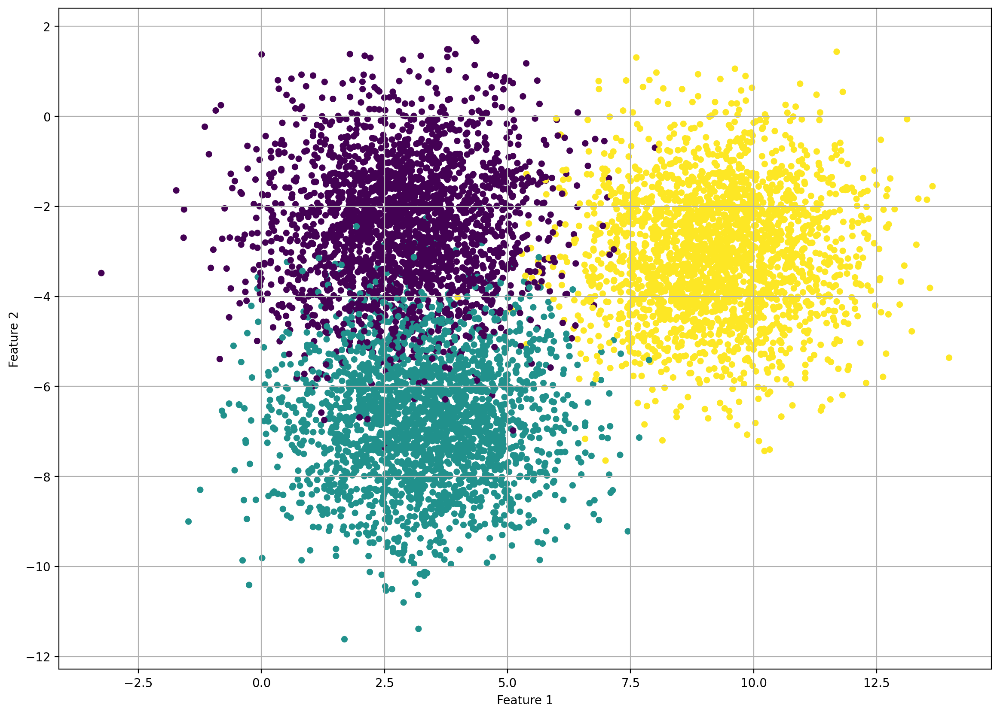

In [26]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=2,n_clusters=3,test_size=0.3,n_samples=10000,random_state = 30)
plt.figure(figsize=(14,10))
plt.scatter(X_train[:, 0], X_train[:, 1],c=y_train,s=20)
plt.grid()
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

In [27]:
n_samples = [100,500,1000,4000,5000,10000]
d_values = [5,10,50,100,500,1000]
n_planes = [1,5,10,50,100,500]

### Visualization 1.0

d=5	samples=100	Training Time: 0.0000 s	Querying Time: 0.0009 s	Accuracy: 0.9000
d=5	samples=500	Training Time: 0.0000 s	Querying Time: 0.0018 s	Accuracy: 1.0000
d=5	samples=1000	Training Time: 0.0000 s	Querying Time: 0.0048 s	Accuracy: 0.9800
d=5	samples=4000	Training Time: 0.0000 s	Querying Time: 0.0595 s	Accuracy: 0.9900
d=5	samples=5000	Training Time: 0.0000 s	Querying Time: 0.0859 s	Accuracy: 0.9900
d=5	samples=10000	Training Time: 0.0000 s	Querying Time: 0.3414 s	Accuracy: 0.9810
d=10	samples=100	Training Time: 0.0000 s	Querying Time: 0.0004 s	Accuracy: 1.0000
d=10	samples=500	Training Time: 0.0000 s	Querying Time: 0.0020 s	Accuracy: 1.0000
d=10	samples=1000	Training Time: 0.0000 s	Querying Time: 0.0058 s	Accuracy: 1.0000
d=10	samples=4000	Training Time: 0.0000 s	Querying Time: 0.0663 s	Accuracy: 1.0000
d=10	samples=5000	Training Time: 0.0000 s	Querying Time: 0.1007 s	Accuracy: 1.0000
d=10	samples=10000	Training Time: 0.0000 s	Querying Time: 0.3932 s	Accuracy: 1.0000
d=50	samples

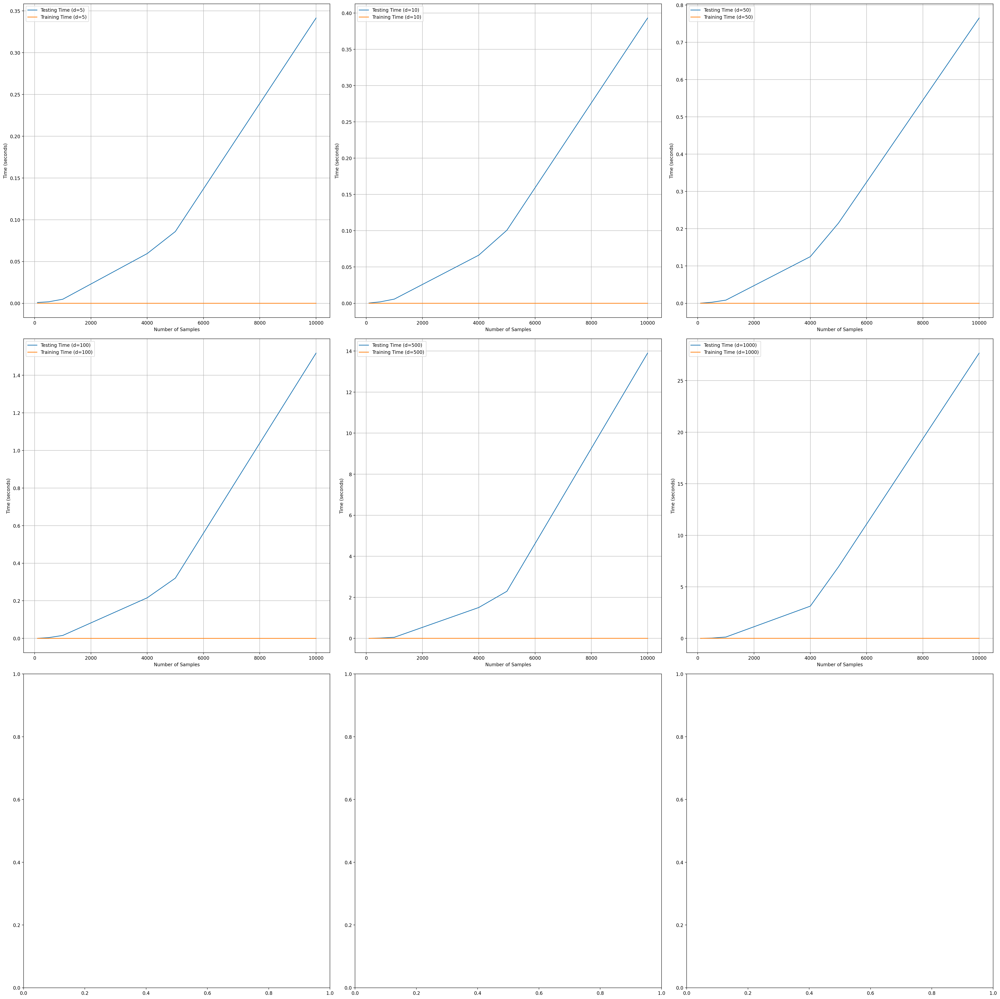

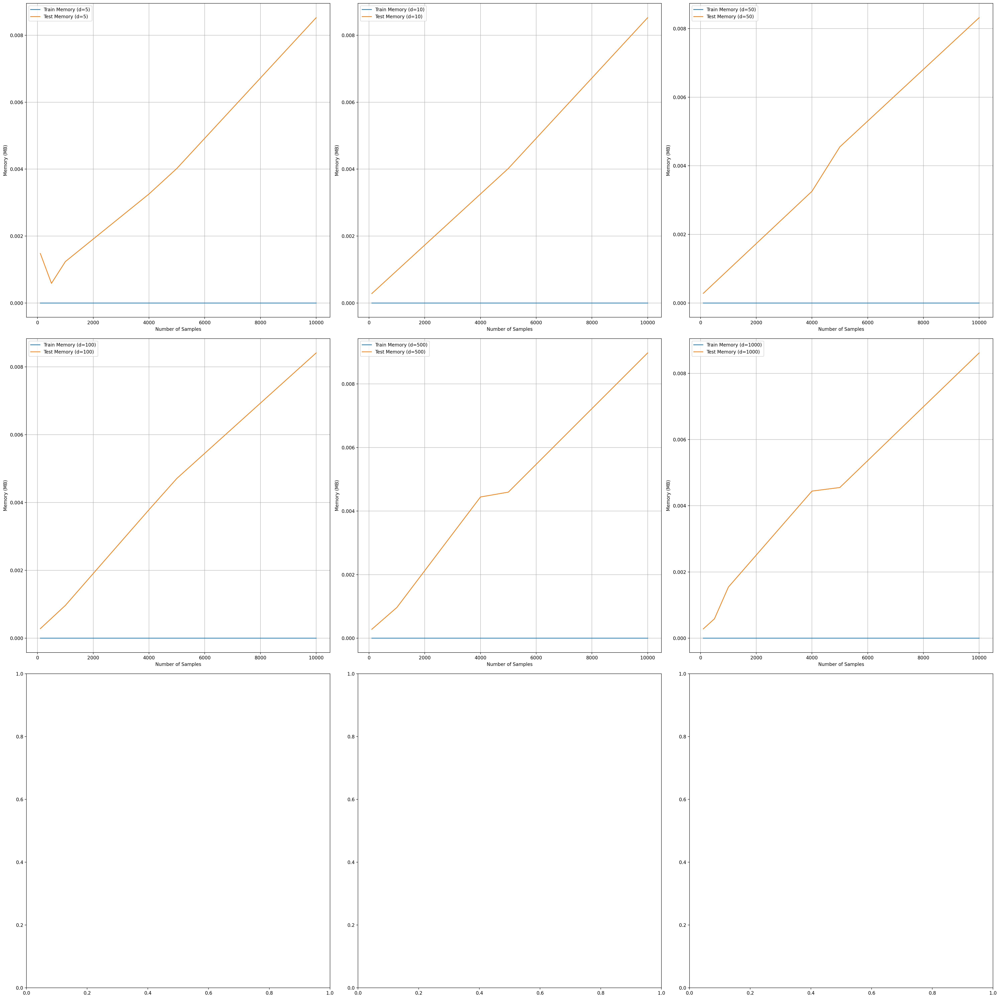

In [28]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import time
import tracemalloc

def time_memory(func, *args, **kwargs):
    tracemalloc.start()  
    start_time = time.time()  

    # Run the function
    result = func(*args, **kwargs)
    end_time = time.time()  
    current, peak = tracemalloc.get_traced_memory() 
    tracemalloc.stop() 

    time_elapsed = end_time - start_time 
    memory_used = current/(1024*1024)  

    return result, time_elapsed, memory_used



test_time_naive = {}
train_time_naive = {}
train_memory_naive = {}
test_memory_naive = {}


for d in d_values:
    temp_test_time = []
    temp_train_time = []
    temp_train_memory = []
    temp_test_memory = []
    
    for n_sample in n_samples:

        X_train, X_test, y_train, y_test = createDataset(
            noise=1, d=d, n_clusters=10, test_size=0.1, n_samples=n_sample, random_state=30
        )

        knn_naive = KNN_naive()
        _, train_time_elapsed, train_memory = time_memory(knn_naive.fit, X_train, y_train)

        preds, test_time_elapsed, test_memory = time_memory(knn_naive.predict, X_test)
        accuracy = accuracy_score(y_test, preds)
        
        temp_train_time.append(train_time_elapsed)
        temp_test_time.append(test_time_elapsed)
        temp_train_memory.append(train_memory)  
        temp_test_memory.append(test_memory)    

        print(f"d={d}\tsamples={n_sample}\tTraining Time: {train_time_elapsed:.4f} s\tQuerying Time: {test_time_elapsed:.4f} s\tAccuracy: {accuracy:.4f}")
    

    test_time_naive[d] = temp_test_time
    train_time_naive[d] = temp_train_time
    train_memory_naive[d] = temp_train_memory
    test_memory_naive[d] = temp_test_memory


fig, axes = plt.subplots(len(d_values) // 3 + 1, 3, figsize=(30, 30))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, test_time_naive[d], label=f'Testing Time (d={d})')
    ax.plot(n_samples, train_time_naive[d], label=f'Training Time (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Time (seconds)")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(len(d_values) // 3 + 1, 3, figsize=(30, 30))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, train_memory_naive[d], label=f'Train Memory (d={d})')
    ax.plot(n_samples, test_memory_naive[d], label=f'Test Memory (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Memory (MB)")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

d=5	samples=100	Training Time: 0.0002 s	Testing Time: 0.0004 s	Accuracy: 0.9000
d=5	samples=500	Training Time: 0.0007 s	Testing Time: 0.0018 s	Accuracy: 0.9400
d=5	samples=1000	Training Time: 0.0007 s	Testing Time: 0.0031 s	Accuracy: 0.9600
d=5	samples=4000	Training Time: 0.0026 s	Testing Time: 0.0146 s	Accuracy: 0.9850
d=5	samples=5000	Training Time: 0.0028 s	Testing Time: 0.0192 s	Accuracy: 0.9660
d=5	samples=10000	Training Time: 0.0059 s	Testing Time: 0.0400 s	Accuracy: 0.9690
d=10	samples=100	Training Time: 0.0001 s	Testing Time: 0.0003 s	Accuracy: 0.8000
d=10	samples=500	Training Time: 0.0003 s	Testing Time: 0.0015 s	Accuracy: 1.0000
d=10	samples=1000	Training Time: 0.0006 s	Testing Time: 0.0031 s	Accuracy: 0.9900
d=10	samples=4000	Training Time: 0.0027 s	Testing Time: 0.0148 s	Accuracy: 0.9900
d=10	samples=5000	Training Time: 0.0028 s	Testing Time: 0.0187 s	Accuracy: 0.9860
d=10	samples=10000	Training Time: 0.0059 s	Testing Time: 0.0410 s	Accuracy: 0.9960
d=50	samples=100	Trainin

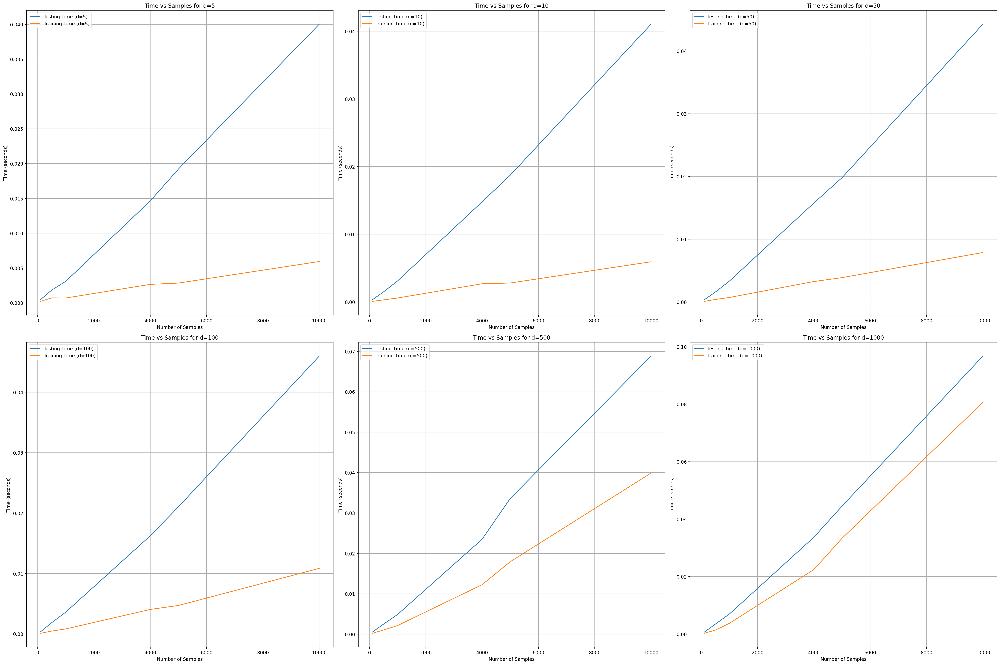

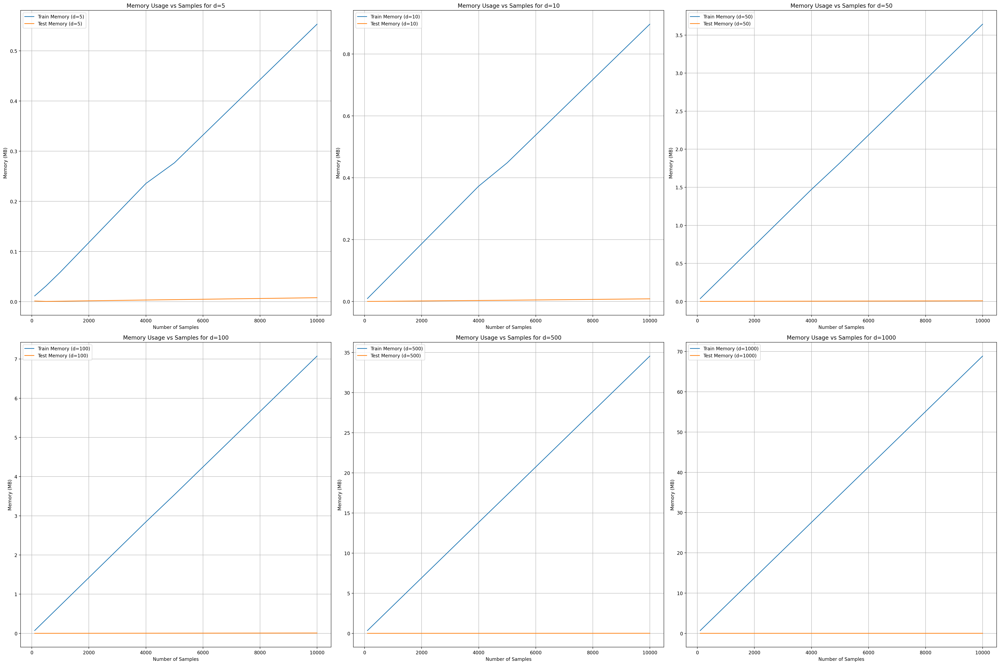

In [29]:
test_time_kd, train_time_kd, train_memory_kd, test_memory_kd = {}, {}, {}, {}

for d in d_values:
    test_time_kd[d], train_time_kd[d], train_memory_kd[d], test_memory_kd[d] = [], [], [], []

    for n_sample in n_samples:
        X_train, X_test, y_train, y_test = createDataset(
            noise=1, d=d, n_clusters=10, test_size=0.1, n_samples=n_sample, random_state=30
        )

        knn_kd = KNN_KD()
        _, train_time, train_memory = time_memory(knn_kd.fit, X_train, y_train)
        preds, test_time, test_memory = time_memory(knn_kd.predict, X_test)
        accuracy = accuracy_score(y_test, preds)

       
        train_time_kd[d].append(train_time)
        test_time_kd[d].append(test_time)
        train_memory_kd[d].append(train_memory)
        test_memory_kd[d].append(test_memory)

        print(f"d={d}\tsamples={n_sample}\tTraining Time: {train_time:.4f} s\tTesting Time: {test_time:.4f} s\tAccuracy: {accuracy:.4f}")


rows = (len(d_values) + 2) // 3  
fig, axes = plt.subplots(rows, 3, figsize=(30, 10 * rows))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, test_time_kd[d], label=f'Testing Time (d={d})')
    ax.plot(n_samples, train_time_kd[d], label=f'Training Time (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Time (seconds)")
    ax.grid(True)
    ax.legend()
    ax.set_title(f"Time vs Samples for d={d}")

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(rows, 3, figsize=(30, 10 * rows))
axes = axes.flatten()

for i, d in enumerate(d_values):
    ax = axes[i]
    ax.plot(n_samples, train_memory_kd[d], label=f'Train Memory (d={d})')
    ax.plot(n_samples, test_memory_kd[d], label=f'Test Memory (d={d})')
    ax.set_xlabel("Number of Samples")
    ax.set_ylabel("Memory (MB)")
    ax.grid(True)
    ax.legend()
    ax.set_title(f"Memory Usage vs Samples for d={d}")

plt.tight_layout()
plt.show()

planes=50	d=5	samples=100	 Training Time: 0.0052 s	 Querying Time: 0.0012 s	 Accuracy: 0.9000
planes=50	d=5	samples=500	 Training Time: 0.0193 s	 Querying Time: 0.0042 s	 Accuracy: 1.0000
planes=50	d=5	samples=1000	 Training Time: 0.0457 s	 Querying Time: 0.0085 s	 Accuracy: 0.9900
planes=50	d=5	samples=4000	 Training Time: 0.1681 s	 Querying Time: 0.0374 s	 Accuracy: 0.9875
planes=50	d=5	samples=5000	 Training Time: 0.2148 s	 Querying Time: 0.0593 s	 Accuracy: 0.9820
planes=50	d=5	samples=10000	 Training Time: 0.4030 s	 Querying Time: 0.1532 s	 Accuracy: 0.9790
planes=50	d=10	samples=100	 Training Time: 0.0042 s	 Querying Time: 0.0008 s	 Accuracy: 1.0000
planes=50	d=10	samples=500	 Training Time: 0.0194 s	 Querying Time: 0.0043 s	 Accuracy: 1.0000
planes=50	d=10	samples=1000	 Training Time: 0.0400 s	 Querying Time: 0.0103 s	 Accuracy: 1.0000
planes=50	d=10	samples=4000	 Training Time: 0.1795 s	 Querying Time: 0.0563 s	 Accuracy: 1.0000
planes=50	d=10	samples=5000	 Training Time: 0.195

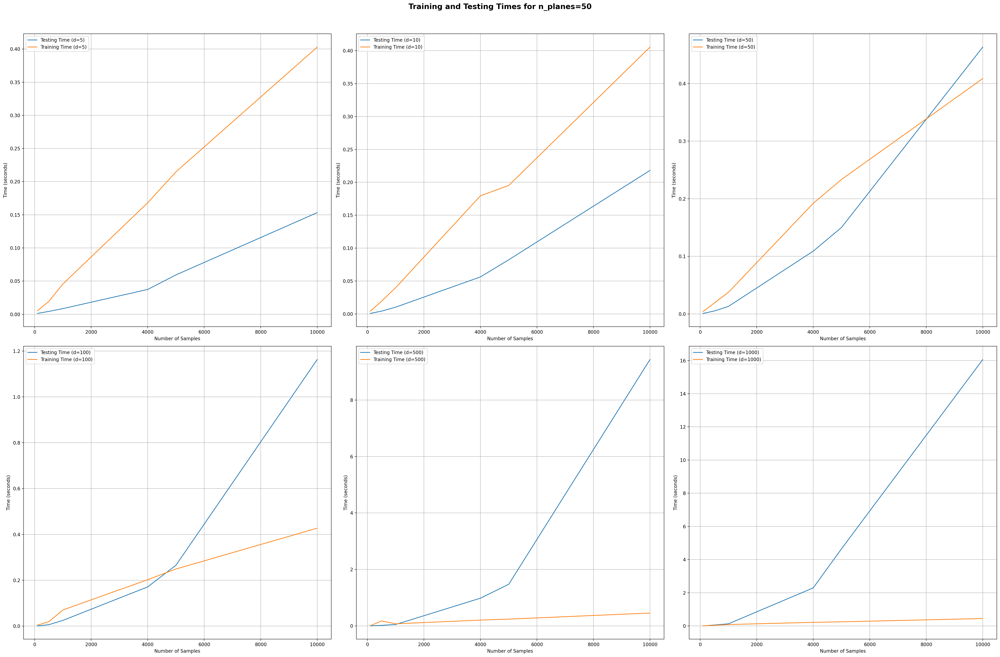

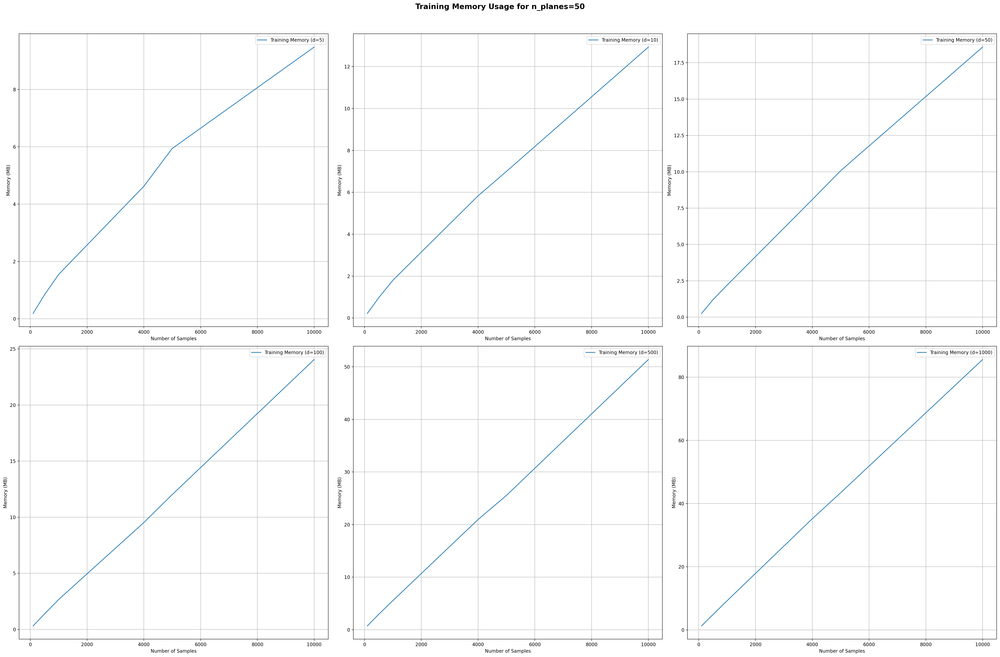

In [33]:
test_time_LSH, train_time_LSH, train_memory_LSH = {}, {}, {}

for n_plane in [50]:
    for d in d_values:
        temp_train_time_LSH, temp_test_time, temp_train_memory = [], [], []

        for n_sample in n_samples:
            X_train, X_test, y_train, y_test = createDataset(
                noise=1, d=d, n_clusters=10, test_size=0.1, n_samples=n_sample, random_state=30
            )

            
            lsh = LSH(n_planes=n_plane)
    
            _, fit_time, fit_memory = time_memory(lsh.fit, X_train, y_train)    
            preds, predict_time, _ = time_memory(lsh.predict, X_test)
    
            accuracy = accuracy_score(y_test, preds)
    
            temp_train_time_LSH.append(fit_time)
            temp_test_time.append(predict_time)
            temp_train_memory.append(fit_memory)

            print(f"planes={n_plane}\td={d}\tsamples={n_sample}\t",f"Training Time: {fit_time:.4f} s\t Querying Time: {predict_time:.4f} s\t Accuracy: {accuracy:.4f}")

        test_time_LSH[d] = temp_test_time
        train_time_LSH[d] = temp_train_time_LSH
        train_memory_LSH[d] = temp_train_memory


    rows = len(d_values) // 3 + (1 if len(d_values) % 3 != 0 else 0)
    fig, axes = plt.subplots(rows, 3, figsize=(30, 10 * rows))
    axes = axes.flatten()

    for i, d in enumerate(d_values):
        ax = axes[i]
        ax.plot(n_samples, test_time_LSH[d], label=f'Testing Time (d={d})')
        ax.plot(n_samples, train_time_LSH[d], label=f'Training Time (d={d})')
        ax.set_xlabel("Number of Samples")
        ax.set_ylabel("Time (seconds)")
        ax.grid(True)
        ax.legend()

    plt.suptitle(f"Training and Testing Times for n_planes={n_plane}", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Plotting training memory usage
    fig, axes = plt.subplots(rows, 3, figsize=(30, 10 * rows))
    axes = axes.flatten()


    for i, d in enumerate(d_values):
        ax = axes[i]
        ax.plot(n_samples, train_memory_LSH[d], label=f'Training Memory (d={d})')
        ax.set_xlabel("Number of Samples")
        ax.set_ylabel("Memory (MB)")
        ax.grid(True)
        ax.legend()

    plt.suptitle(f"Training Memory Usage for n_planes={n_plane}", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

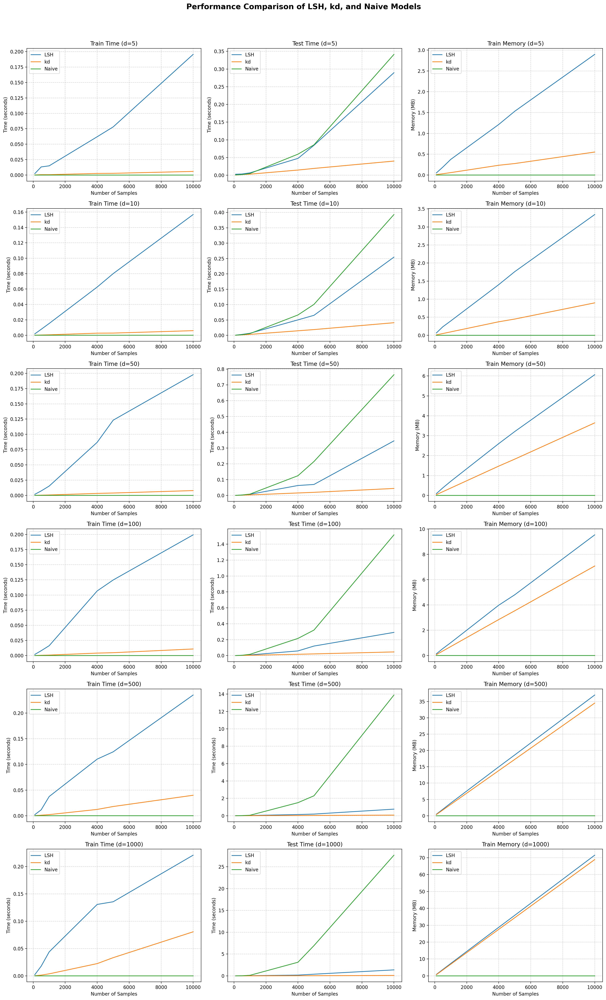

In [31]:
import matplotlib.pyplot as plt

num_rows = len(d_values)

# Create subplots with three columns 
fig, axes = plt.subplots(num_rows, 3, figsize=(18, num_rows * 5))
fig.suptitle("Performance Comparison of LSH, kd, and Naive Models", fontsize=16, fontweight='bold')
axes = axes.reshape(num_rows, 3)  

for i, d in enumerate(d_values):
    # training time
    ax_train_time = axes[i, 0]
    ax_train_time.plot(n_samples, train_time_LSH[d], label="LSH")
    ax_train_time.plot(n_samples, train_time_kd[d], label="kd")
    ax_train_time.plot(n_samples, train_time_naive[d], label="Naive")
    ax_train_time.set_title(f"Train Time (d={d})")
    ax_train_time.set_xlabel("Number of Samples")
    ax_train_time.set_ylabel("Time (seconds)")
    ax_train_time.legend()
    ax_train_time.grid(True,linestyle='--',alpha=0.6)

    # testing time
    ax_test_time = axes[i, 1]
    ax_test_time.plot(n_samples, test_time_LSH[d], label="LSH")
    ax_test_time.plot(n_samples, test_time_kd[d], label="kd")
    ax_test_time.plot(n_samples, test_time_naive[d], label="Naive")
    ax_test_time.set_title(f"Test Time (d={d})")
    ax_test_time.set_xlabel("Number of Samples")
    ax_test_time.set_ylabel("Time (seconds)")
    ax_test_time.legend()
    ax_test_time.grid(True,linestyle='--',alpha=0.6)

    # training memory
    ax_train_memory = axes[i, 2]
    ax_train_memory.plot(n_samples, train_memory_LSH[d], label="LSH" )
    ax_train_memory.plot(n_samples, train_memory_kd[d], label="kd" )
    ax_train_memory.plot(n_samples, train_memory_naive[d], label="Naive" )
    ax_train_memory.set_title(f"Train Memory (d={d})")
    ax_train_memory.set_xlabel("Number of Samples")
    ax_train_memory.set_ylabel("Memory (MB)")
    ax_train_memory.legend()
    ax_train_memory.grid(True,linestyle='--',alpha=0.6)


plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()


In [21]:
data_plane = {}

for n_plane in n_planes:
    test_time_LSH, train_time_LSH, train_memory_LSH = {}, {}, {}
    for d in d_values:
        temp_train_time_LSH, temp_test_time, temp_train_memory = [], [], []

        for n_sample in n_samples:
            X_train, X_test, y_train, y_test = createDataset(
                noise=1, d=d, n_clusters=10, test_size=0.3, n_samples=n_sample, random_state=30
            )

            lsh = LSH(n_planes=n_plane)

            _, fit_time, fit_memory = time_memory(lsh.fit, X_train, y_train)
            preds, predict_time, _ = time_memory(lsh.predict, X_test)

            accuracy = accuracy_score(y_test, preds)

            temp_train_time_LSH.append(fit_time)
            temp_test_time.append(predict_time)
            temp_train_memory.append(fit_memory)

            print(f"planes={n_plane}\td={d}\tsamples={n_sample}\t"
                  f"Training Time: {fit_time:.4f} s\t Querying Time: {predict_time:.4f} s\t Accuracy: {accuracy:.4f}")

        test_time_LSH[d] = temp_test_time
        train_time_LSH[d] = temp_train_time_LSH
        train_memory_LSH[d] = temp_train_memory

    data_plane[n_plane] = [test_time_LSH,train_time_LSH,train_memory_LSH]


planes=1	d=5	samples=100	Training Time: 0.0009 s	 Querying Time: 0.0024 s	 Accuracy: 0.9000
planes=1	d=5	samples=500	Training Time: 0.0026 s	 Querying Time: 0.0416 s	 Accuracy: 0.9933
planes=1	d=5	samples=1000	Training Time: 0.0046 s	 Querying Time: 0.1056 s	 Accuracy: 0.9733
planes=1	d=5	samples=4000	Training Time: 0.0190 s	 Querying Time: 1.7251 s	 Accuracy: 0.9825
planes=1	d=5	samples=5000	Training Time: 0.0251 s	 Querying Time: 2.6957 s	 Accuracy: 0.9800
planes=1	d=5	samples=10000	Training Time: 0.0506 s	 Querying Time: 11.0352 s	 Accuracy: 0.9787
planes=1	d=10	samples=100	Training Time: 0.0007 s	 Querying Time: 0.0022 s	 Accuracy: 1.0000
planes=1	d=10	samples=500	Training Time: 0.0025 s	 Querying Time: 0.0425 s	 Accuracy: 0.9933
planes=1	d=10	samples=1000	Training Time: 0.0084 s	 Querying Time: 0.1138 s	 Accuracy: 1.0000
planes=1	d=10	samples=4000	Training Time: 0.0201 s	 Querying Time: 1.7290 s	 Accuracy: 1.0000
planes=1	d=10	samples=5000	Training Time: 0.0246 s	 Querying Time: 2

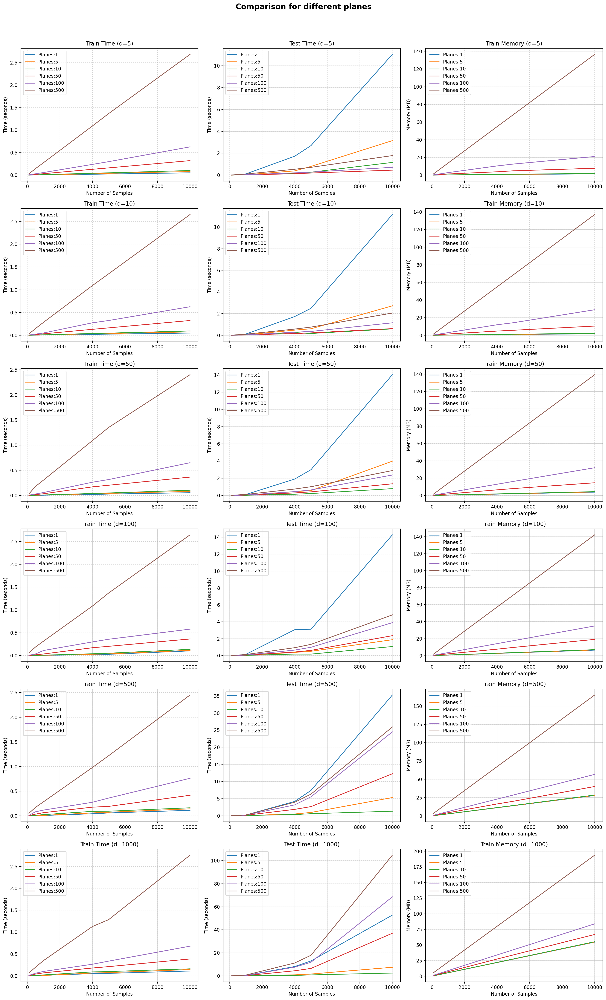

In [32]:
# for plane,data in data_plane.items():
#     num_rows = len(d_values)

#     # Create subplots with three columns 
fig, axes = plt.subplots(num_rows, 3, figsize=(18, num_rows * 5))
fig.suptitle("Comparison for different planes", fontsize=16, fontweight='bold')
axes = axes.reshape(num_rows, 3)  

for i, d in enumerate(d_values):
    # training time
    ax_train_time = axes[i, 0]

    for plane,data in data_plane.items():
        ax_train_time.plot(n_samples,data[1][d], label=f"Planes:{plane}")

    ax_train_time.set_title(f"Train Time (d={d})")
    ax_train_time.set_xlabel("Number of Samples")
    ax_train_time.set_ylabel("Time (seconds)")
    ax_train_time.legend()
    ax_train_time.grid(True,linestyle='--',alpha=0.6)

    # testing time
    ax_test_time = axes[i, 1]
    for plane,data in data_plane.items():
        ax_test_time.plot(n_samples,data[0][d],label=f"Planes:{plane}")
    ax_test_time.set_title(f"Test Time (d={d})")
    ax_test_time.set_xlabel("Number of Samples")
    ax_test_time.set_ylabel("Time (seconds)")
    ax_test_time.legend()
    ax_test_time.grid(True,linestyle='--',alpha=0.6)

    # training memory
    ax_train_memory = axes[i, 2]
    for plane,data in data_plane.items():
        ax_train_memory.plot(n_samples,data[2][d],label=f"Planes:{plane}")
    ax_train_memory.set_title(f"Train Memory (d={d})")
    ax_train_memory.set_xlabel("Number of Samples")
    ax_train_memory.set_ylabel("Memory (MB)")
    ax_train_memory.legend()
    ax_train_memory.grid(True,linestyle='--',alpha=0.6)


plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()


In [ ]:
# Saving python dictionaries as json files

import json

with open("dictionary_planes.json","w") as f:
    json.dump(data_plane,f)

with open("dictionary_planes.json","r") as f:
    loaded_dict = json.load(f)

print(loaded_dict)


{'1': [{'5': [0.0023970603942871094, 0.04163503646850586, 0.10556793212890625, 1.7251100540161133, 2.695688009262085, 11.035171508789062], '10': [0.0022187232971191406, 0.042482614517211914, 0.11381316184997559, 1.7290167808532715, 2.4899332523345947, 11.154369831085205], '50': [0.0020852088928222656, 0.029657840728759766, 0.10686564445495605, 1.9028418064117432, 2.9909508228302, 14.03746223449707], '100': [0.0022287368774414062, 0.033354759216308594, 0.14592957496643066, 3.0595030784606934, 3.1167542934417725, 14.285356044769287], '500': [0.003323793411254883, 0.05149650573730469, 0.22001266479492188, 4.17622447013855, 7.393957138061523, 35.25929665565491], '1000': [0.004897117614746094, 0.09563541412353516, 0.3677079677581787, 8.11051344871521, 12.938544511795044, 52.73516917228699]}, {'5': [0.0008978843688964844, 0.002554178237915039, 0.004616260528564453, 0.01901555061340332, 0.025120019912719727, 0.05059409141540527], '10': [0.0006859302520751953, 0.0025000572204589844, 0.00836014

### Visualising the approxiamtions

In [45]:
X_train,X_test,y_train,y_test = createDataset(noise=1,d=2,n_clusters=3,test_size=0.3,n_samples=200,random_state = 30)

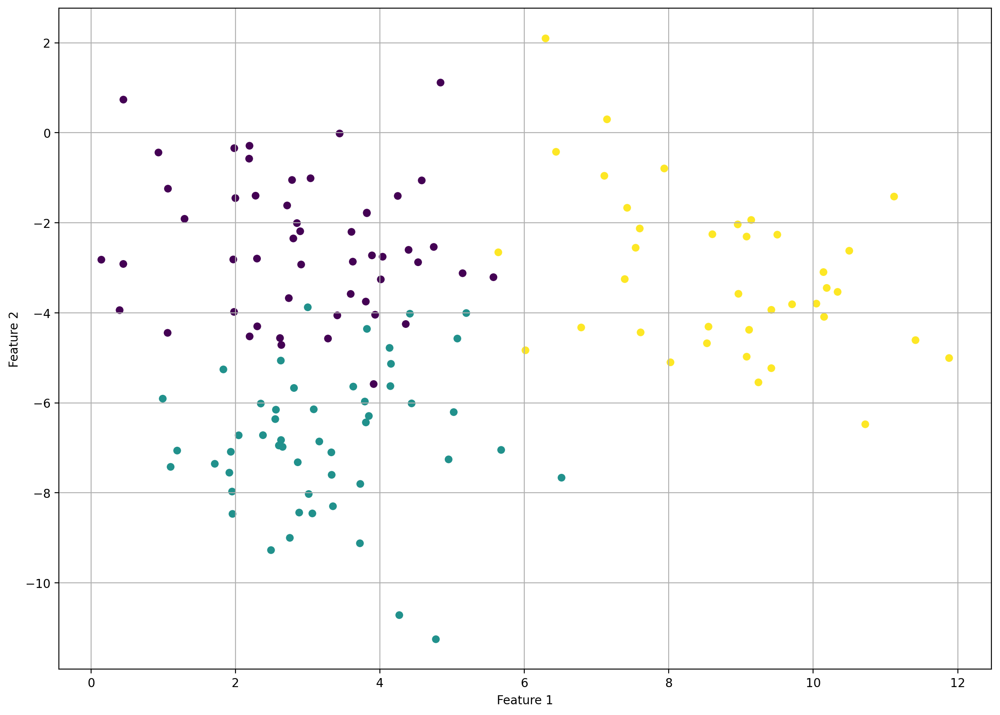

In [46]:
plt.figure(figsize=(14,10))
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train,cmap='viridis', s=30)
plt.grid()
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

In [47]:
query = np.array([5.5,-4.0])

[[ 5.1964985  -4.00438393]
 [ 5.07296587 -4.57122955]
 [ 5.57261243 -3.20806928]]
[1 1 0]


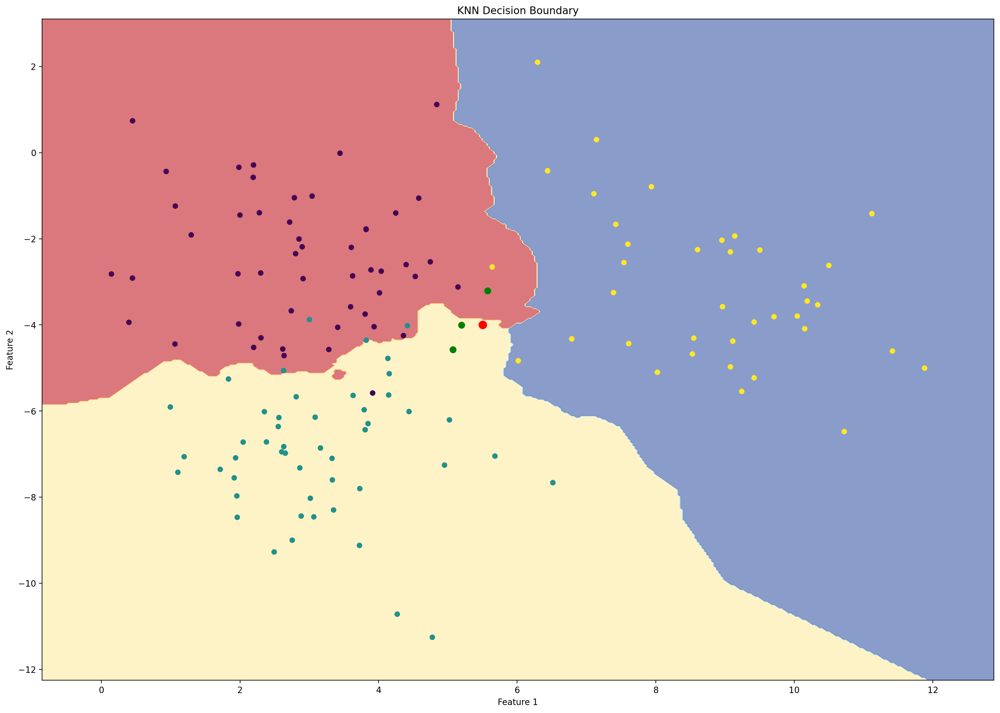

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

grid_points = np.c_[xx.ravel(), yy.ravel()]

knn_naive = KNN_naive()
knn_naive.fit(X_train, y_train)

preds = knn_naive.predict(grid_points)

preds = preds.reshape(xx.shape)

pred_query = knn_naive.predict(query)
neighbours, y_labels = knn_naive.neighbours(query)
print(neighbours)
print(y_labels)



plt.figure(figsize=(20,14))

plt.contourf(xx, yy, preds, alpha=0.6, cmap=plt.cm.RdYlBu)

plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plt.scatter(neighbours[:,0],neighbours[:,1],s=50,c='green')
plt.scatter(query[0],query[1],c='red',s=80)
plt.title("KNN Decision Boundary")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


[[ 5.1964985  -4.00438393]
 [ 5.07296587 -4.57122955]
 [ 4.41601646 -4.01889375]]
[1 1 1]


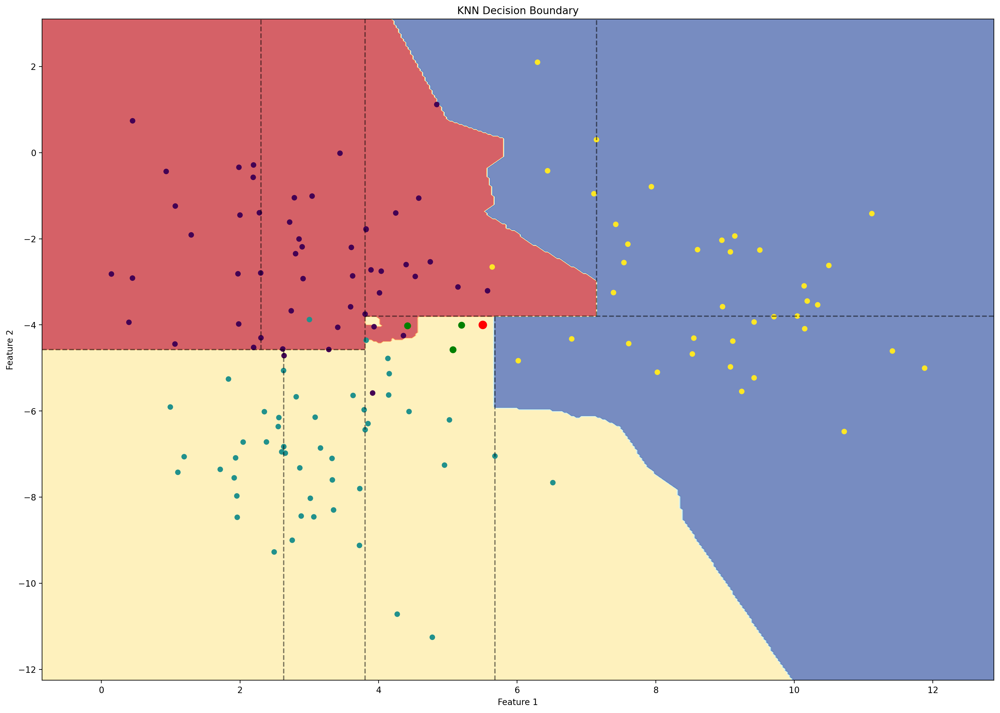

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]

# Train the KNN classifier
knn_kd = KNN_KD(leaf_size=30)
knn_kd.fit(X_train, y_train)
# print(grid_points)

# Predict for all grid points
preds = knn_kd.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)

# pred_query = knn_kd.predict(query)
neighbours, y_labels = knn_kd.neighbours(knn_kd.tree.tree,query)
print(neighbours)
print(y_labels)


def plot_classifier_lines(node, x_start, x_end, y_start, y_end, axis=0):
    if node.left is None and node.right is None:
        return
    if axis == 0:
        plt.plot([node.value, node.value], [y_start, y_end],c='black',alpha=0.5,linestyle='--')
        plot_classifier_lines(node.left, x_start, node.value, y_start, y_end, axis=(axis + 1) % 2)
        plot_classifier_lines(node.right, node.value, x_end, y_start, y_end, axis=(axis + 1) % 2)
        
    else:
        plt.plot([x_start, x_end], [node.value, node.value],c='black',alpha=0.5,linestyle='--')
        plot_classifier_lines(node.left, x_start, x_end, y_start, node.value, axis=(axis + 1) % 2)
        plot_classifier_lines(node.right, x_start, x_end, node.value, y_end, axis=(axis + 1) % 2)
    
    
plt.figure(figsize=(20,14))

# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.7, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plot_classifier_lines(knn_kd.tree.tree,x_min,x_max,y_min,y_max)
plt.scatter(neighbours[:,0],neighbours[:,1],s=50,c='green')
plt.scatter(query[0],query[1],c='red',s=80)

plt.title("KNN Decision Boundary")
plt.xlim(x_min,x_max)
plt.ylim(y_min,y_max)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


[[ 1.          5.57261243 -3.20806928]
 [ 1.          5.14567919 -3.11958113]
 [ 1.          6.78747144 -4.32511448]]
[0 0 2]


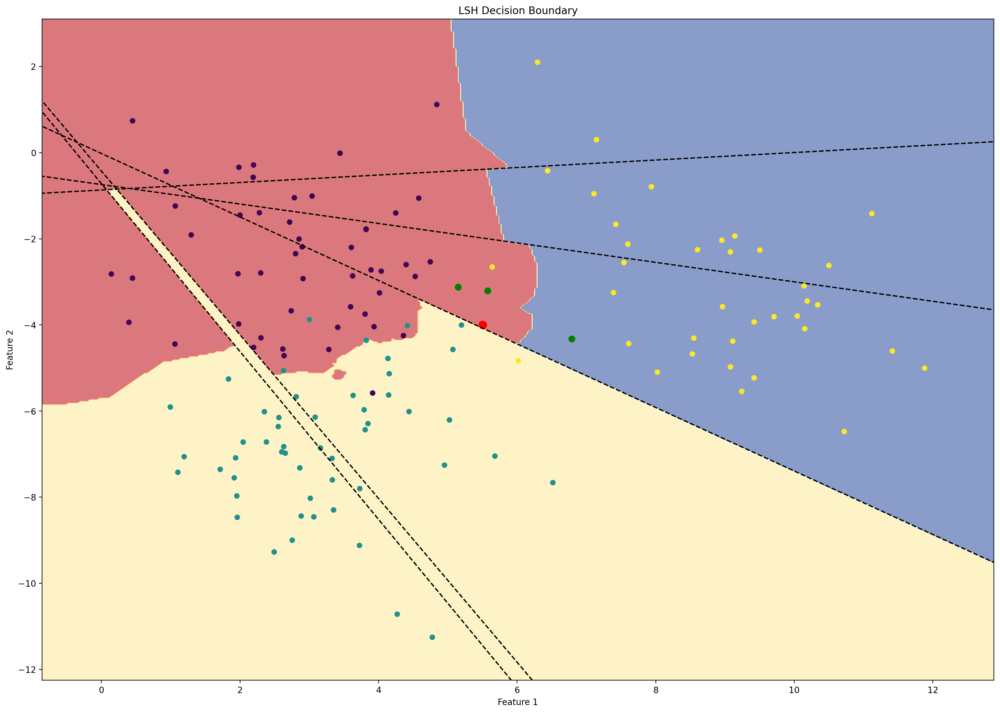

In [50]:
import numpy as np
import matplotlib.pyplot as plt


# Create a mesh grid of points
x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 400), np.linspace(y_min, y_max, 400))

# Flatten the grid to pass to the classifier
grid_points = np.c_[xx.ravel(), yy.ravel()]
# grid_points_line = np.c_[np.array(1),xx.ravel(), yy.ravel()]

# Train the KNN classifier
planes = 5
lsh = LSH(n_planes=planes,mean=8,std=5)
lsh.fit(X_train, y_train)

# Predict for all grid points
preds = lsh.predict(grid_points)

# Reshape the predictions back to the shape of the mesh grid
preds = preds.reshape(xx.shape)


# pred_query = lsh.predict(query)
neighbours, y_labels = lsh.neighbours(query)
print(neighbours)
print(y_labels)


plt.figure(figsize=(20,14))

weights = lsh.weights
for i in range(planes):
    b1, w1, w2 = weights[:,i]
    x1_values = np.linspace(-100, 100, 400)
    x2_values = - (w1 / w2) * x1_values - (b1 / w2)
    plt.plot(x1_values, x2_values,c="black",linestyle='--')


# Plot the decision boundary
plt.contourf(xx, yy, preds, alpha=0.6, cmap=plt.cm.RdYlBu)

# Plot the training points
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='viridis', s=30)

plt.scatter(neighbours[:,1],neighbours[:,2],s=50,c='green')
plt.scatter(query[0],query[1],c='red',s=80)

plt.title("LSH Decision Boundary")
plt.xlim(x_min,x_max)
plt.ylim(y_min,y_max)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()


